<a href="https://colab.research.google.com/github/Sunxiaoni/TopicModellingCluster/blob/main/NTM%2BTOP2VEC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Correct way to clone repo from git in Colab!


In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [ ]:
%cd '/content/drive/NeuralTopicModelling'
!git clone https://github.com/zll17/Neural_Topic_Models
%cd Neural_Topic_Models/
!pip install -r requirements.txt


[Errno 2] No such file or directory: '/content/drive/NeuralTopicModelling'
/content
Cloning into 'Neural_Topic_Models'...
remote: Enumerating objects: 604, done.
remote: Counting objects: 100% (97/97), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 604 (delta 65), reused 61 (delta 34), pack-reused 507
Receiving objects: 100% (604/604), 132.67 MiB | 26.37 MiB/s, done.
Resolving deltas: 100% (265/265), done.
/content/Neural_Topic_Models
     |████████████████████████████████| 136 kB 5.0 MB/s 
     |████████████████████████████████| 2.8 MB 43.6 MB/s 
  Created wheel for pyhanlp: filename=pyhanlp-0.1.79-py3-none-any.whl size=29804 sha256=ece249ad863ab3b6930eeb53d146700be28ffd86955733409f0dfbba31218cf5
  Stored in directory: /root/.cache/pip/wheels/27/48/ad/61fea783778a3ea1bf4a62b7eab8f93842694cde7f9899e03b
  Created wheel for hanlp-downloader: filename=hanlp_downloader-0.0.23-py3-none-any.whl size=13777 sha256=ecf89897167f0adec20cce0caff9bd6f4342d1a2830b06c2cb4a4822bc

Data import

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving sample10000.csv to sample10000.csv


In [ ]:
import pandas as pd
import io
model = pd.read_csv(io.BytesIO(uploaded["sample10000.csv"]), delimiter=",", error_bad_lines=False)
model.shape

(10000, 1)

In [ ]:
model.head(5)

,interpretation
0,Feeling hot
1,Change Sportstyle
2,Missed me
3,Set set up Bluetooth
4,Radio radio station Absolute Radio 90s


In [ ]:
sample_df = model.drop_duplicates(subset="interpretation", keep="last")

In [ ]:
sample_df.shape

(10000, 1)

In [ ]:
sample_df = sample_df[["interpretation"]].copy().sample(n=10000)

In [ ]:
sample_df.shape

(10000, 1)

In [ ]:
sample_df.head(5)

,interpretation
6350,Can you tell me A conditioning down
3882,That's what you know
2326,Play their ways
5836,Turn volume up to
989,Turn the phone to level 40


In [ ]:
#sample_df.to_csv('sample10000.csv', index=False, sep=',', encoding='utf-8') 
#files.download('sample10000.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
%cd 'data/'

/content/Neural_Topic_Models/data


In [ ]:
# convert to txt
sample_df.to_csv('mydata_lines.txt', header=None, index=None, sep=' ', mode='w+')

In [ ]:
%cd ..

/content/Neural_Topic_Models


# ETM: Topic Modeling in Embedding Spaces [unkown error]
VAE + Gaussian Softmax + Embedding

The architecture is a straightforward VAE, with the topic-word distribution matrix decomposed as the product of the topic vectors and the word vectors. The topic vectors and word vectors are jointly trained with the topic modeling process. A note-worthy mentioned advantage of this model is that it can improve the interpretability of topics by locatting the topic vectors and the word vectors in the same space. Correspondingly, the model requires more time to converge to an ideal result than others since it has more parameters to adjust.

Explaination for some arguments:

​ --emb_dim: the dimension of the topic vectors as well as the word vectors, default set as 300.

The meaning of other arguments can be referred to the GSM model.

In [ ]:
uploaded = files.upload()

Saving etm_arch.png to etm_arch.png


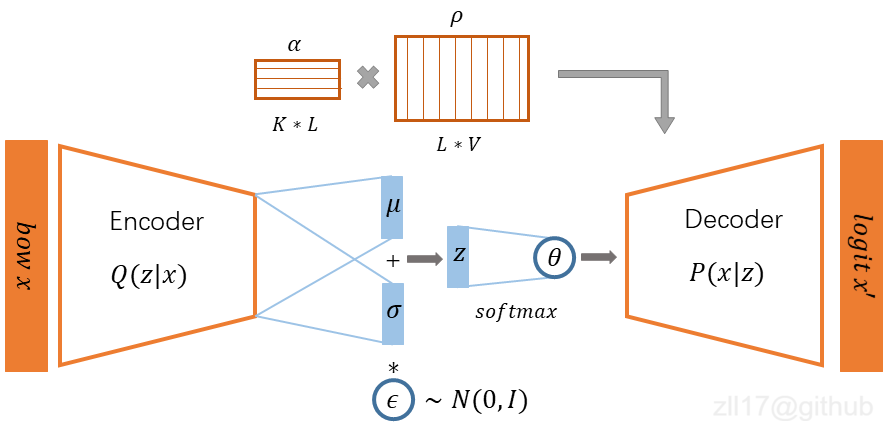

In [ ]:
from IPython.display import Image
Image("etm_arch.png", width=800)

In [ ]:
! python3 ETM_run.py --taskname mydata --n_topic 30 --num_epochs 10 --emb_dim 300


Tokenizing ...
Using SpaCy tokenizer
Processed 5603 documents.
voc size: 602
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Epoch   1	Iter   10	Loss:9.7273827	Rec Loss:9.7268353	KL Div:0.0005470
Epoch   2	Iter   10	Loss:9.1497087	Rec Loss:9.1494999	KL Div:0.0002089
Epoch   3	Iter   10	Loss:9.7399149	Rec Loss:9.7398338	KL Div:0.0000806
Epoch   4	Iter   10	Loss:9.0089426	Rec Loss:9.0089016	KL Div:0.0000414
Epoch   5	Iter   10	Loss:9.0088959	Rec Loss:9.0088711	KL Div:0.0000249
Epoch   6	Iter   10	Loss:9.0574722	Rec Loss:9.0574532	KL Div:0.0000188
Epoch   7	Iter   10	Loss:9.0508633	Rec Lo

# WTM-GMM: WAE with Gaussian Mixture prior + Gaussian Softmax
An improved model of the original WLDA. It takes gaussian mixture distribution as prior distribution, which has two types of evolution strategy: gmm-std and gmm-ctm (GMM-standart and GMM-customized for short, respectively). The gmm-std adopts Gaussian mixture distribution, whose components have fixed means and variances, while those of the gmm-ctm will adjust to fit the latent vectors through the whole training process. The number of the components is usually set as the same as the number of topics. Emperically, the WTM-GMM model usually achieve better performance, both in topic coherence and diversity, than WTM-MMD and NVDM-GSM. It also avoid the mode collapse problem, which is a problem plagues the GMNTM for a long time. I personally recommend this model.

Explaination for some arguments:

​ --dist: the type of the prior distribution, set as gmm-std or gmm-ctm to use the corresponding model.

The meaning of other arguments can be referred to the GSM model.

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving wtm_gmm_arch.png to wtm_gmm_arch.png


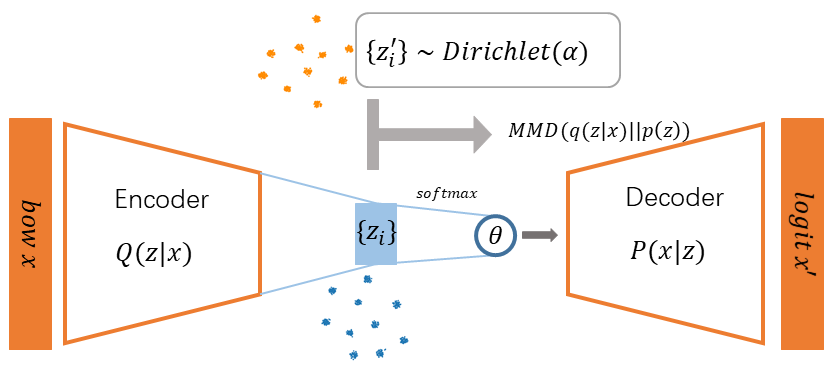

In [ ]:
from IPython.display import Image
Image("wtm_gmm_arch.png", width=800)

In [ ]:
! python3 WTM_run.py --taskname mydata --n_topic 20 --num_epochs 100 --dist gmm-ctm

Processed 5645 documents.
voc size: 664
Epoch   1	Iter   10	Loss:9.7716780	Rec Loss:9.1702671	MMD:0.6014106
Epoch   2	Iter   10	Loss:9.1457653	Rec Loss:8.7756577	MMD:0.3701074
Epoch   3	Iter   10	Loss:9.3454065	Rec Loss:9.0187416	MMD:0.3266650
Epoch   4	Iter   10	Loss:9.0080719	Rec Loss:8.7574739	MMD:0.2505979
Epoch   5	Iter   10	Loss:9.2106476	Rec Loss:8.9714193	MMD:0.2392284
Epoch   6	Iter   10	Loss:9.1781025	Rec Loss:8.9785109	MMD:0.1995917
Epoch   7	Iter   10	Loss:8.8584585	Rec Loss:8.7017555	MMD:0.1567028
Epoch   8	Iter   10	Loss:8.9281588	Rec Loss:8.7847977	MMD:0.1433615
Epoch   9	Iter   10	Loss:9.0883503	Rec Loss:8.9737244	MMD:0.1146262
Epoch  10	Iter   10	Loss:9.1308022	Rec Loss:9.0127258	MMD:0.1180760
Epoch  10	Loss:8.8262877
['directions', 'satnav', 'heating', 'cking', 'massage', 'Direct', 'nearest', 'Navigation', 'Heart', 'blue', 'forecast', 'Yeah', 'Capital', 'traffic', 'No']
['directions', 'cking', 'massage', 'Direct', 'Capital', 'satnav', 'Heart', 'heating', 'nearest', 'N

Evaluation: 
1. Palmetto: https://github.com/dice-group/palmetto-py
2. c_v measure; c_uci; c_npmi (gensim.conherence:https://radimrehurek.com/gensim/models/coherencemodel.html)

   c_v: 
   .3 is bad

   .4 is low

   .55 is okay

   .65 might be as good as it is going to get

   .7 is nice

   .8 is unlikely and

   .9 is probably wrong
https://stackoverflow.com/questions/54762690/what-is-the-meaning-of-coherence-score-0-4-is-it-good-or-bad
3. topic diversity

def calc_topic_diversity(topic_words):
    #'''topic_words is in the form of [[w11,w12,...],[w21,w22,...]]'''
    #vocab = set(sum(topic_words,[]))
    #n_total = len(topic_words) * len(topic_words[0])
    #topic_div = len(vocab) / n_total
    #return topic_div

# Find optimal number of topics [TODO]
https://sagemaker-examples.readthedocs.io/en/latest/scientific_details_of_algorithms/ntm_topic_modeling/ntm_wikitext.html

#Top2Vec

In [ ]:
!pip install top2vec

In [ ]:
import numpy as np 
import pandas as pd 
import json
import os
import ipywidgets as widgets
from IPython.display import clear_output, display
from top2vec import Top2Vec

In [ ]:
!pip3 install spacy
!python3 -m spacy download en_core_web_md

import pprint 
pp = pprint.PrettyPrinter(indent=4)
example = model['interpretation'][0]
pp.pprint(example)

     |████████████████████████████████| 96.4 MB 1.2 MB/s 
  Created wheel for en-core-web-md: filename=en_core_web_md-2.2.5-py3-none-any.whl size=98051301 sha256=7256380be87963eddfdcb435db30fb641e7fa57172002ee53656c34e4781342d
  Stored in directory: /tmp/pip-ephem-wheel-cache-lrauzdgy/wheels/69/c5/b8/4f1c029d89238734311b3269762ab2ee325a42da2ce8edb997
Successfully built en-core-web-md
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_md')
'Feeling hot'


In [ ]:
#Initialise NLP Spacy Parser
import spacy 
import en_core_web_md
nlp = en_core_web_md.load()
example_parse = nlp(example)

#Filter out: 
# 1. stopwords (words or expressions that occur so often that they don't provide additional information. WATCH OUT: make sure that you don't mistakenly filter out stopwords you actually want to keep, especially negations!!)
# 2. Punctuation
# 3. Digits (very hard to understand for a machine in context)
# 3. Transform every word into its lemmatized version ('went' to 'go')
for token in example_parse:
  print(token.lemma_, token.is_stop,token.is_punct,token.is_digit)

feel False False False
hot False False False


In [ ]:
%%time
# list containing processed documents
preprocessed_list = list()
for index, row in model.iterrows():
  # list containing processed tokens
  parsed_sentence_list = list()
  # parse raw text 
  sentence_parsed = nlp(row['interpretation'])  
  # loop through document
  for token in sentence_parsed:
    if not token.is_stop: 
      if not token.is_punct:
        if not token.is_digit:
          parsed_sentence_list.append(token.lemma_.lower())
  
  # join the elements of the list back into a string
  preprocessed_list.append(" ".join(parsed_sentence_list))

CPU times: user 1min 17s, sys: 235 ms, total: 1min 17s
Wall time: 1min 17s


In [ ]:
preprocessed_list

['feel hot',
 'change sportstyle',
 'miss',
 'set set bluetooth',
 'radio radio station absolute radio 90s',
 'direct halifax',
 'navigate southwater',
 'cancel',
 'connect music phone',
 '',
 'fucha silico',
 'play original radio',
 'navigate eh18 1ar',
 'r',
 'sun roof close automatically start steradian',
 'find restaurant route',
 'actually',
 'hi gear come weather pattern get job < date > go to money garfits',
 'switch bus search',
 'navigate sw8 4sx',
 'cold route guidance',
 'change amberlight purple',
 'destination gu4 8gu',
 'play country flm',
 'navigate wrington',
 'temperature vehicle',
 'play absolute radio dab',
 '24.5',
 'fix tyre pressure',
 'service menu',
 'play heart radio come nice',
 'ls whitburn',
 'ondruska',
 'ramsey die go',
 'chocoball',
 'route guidance cm16 7at',
 'alright laura bell bundy sit',
 'en samling ethelinde music',
 'okay',
 'l24 8rl',
 'pakoštane',
 'suspend map',
 'bon jovi',
 'yeah play bbc radio',
 'stop galway stop',
 'turn temperature °',
 '

In [ ]:
"""
hdbscan cluster_selection_method, "eom"[Excess of Mass , by default], or "leaf"[pick one or two large clusters and then a number of small extra clusters, like select leave nodes of the tree]
"""
top2vec = Top2Vec(documents=preprocessed_list, speed="learn", workers=4)


2021-08-11 22:59:54,637 - top2vec - INFO - Pre-processing documents for training
2021-08-11 22:59:54,764 - top2vec - INFO - Creating joint document/word embedding
2021-08-11 23:00:16,277 - top2vec - INFO - Creating lower dimension embedding of documents
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
2021-08-11 23:00:57,916 - top2vec - INFO - Finding dense areas of documents
2021-08-11 23:00:58,710 - top2vec - INFO - Finding topics


# Use Top2Vec for Semantic Search

# 1. Search Topics

Label(value='Enter keywords seperated by space: ')

Text(value='play radio navigate phone weather music mercedes')

Label(value='Enter negative keywords seperated by space: ')

Text(value='')

Label(value='Choose number of topics: ')

Text(value='20')

Button(description='show topics', style=ButtonStyle())

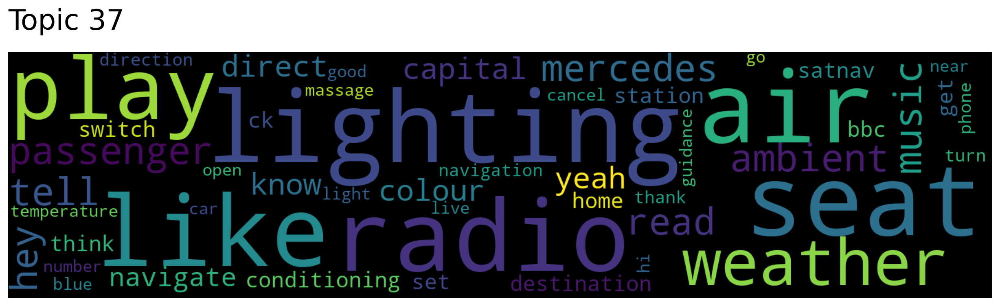

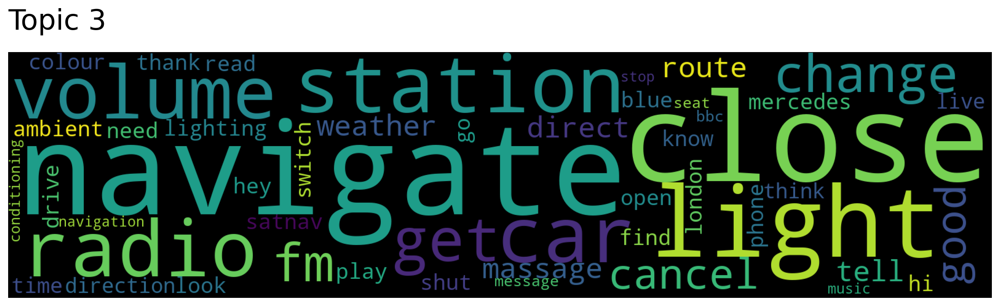

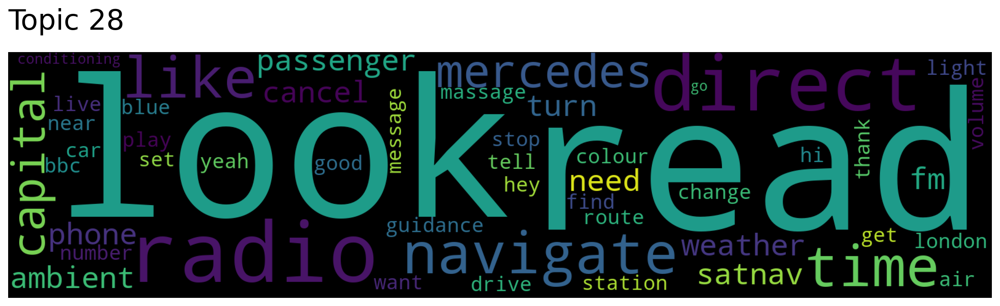

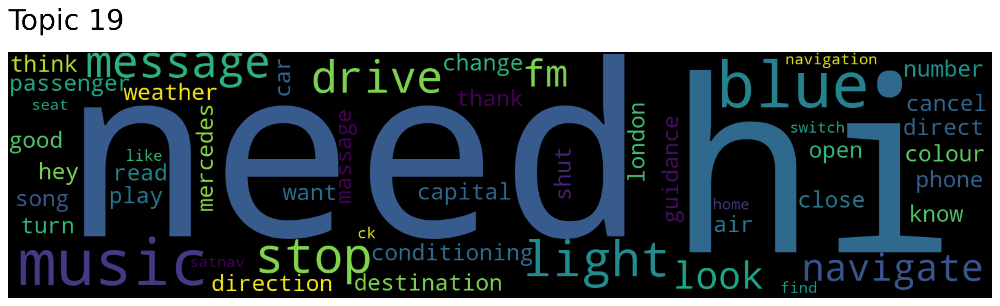

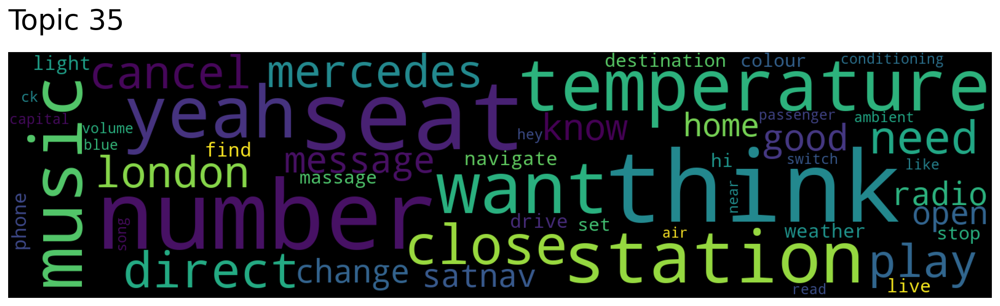

...

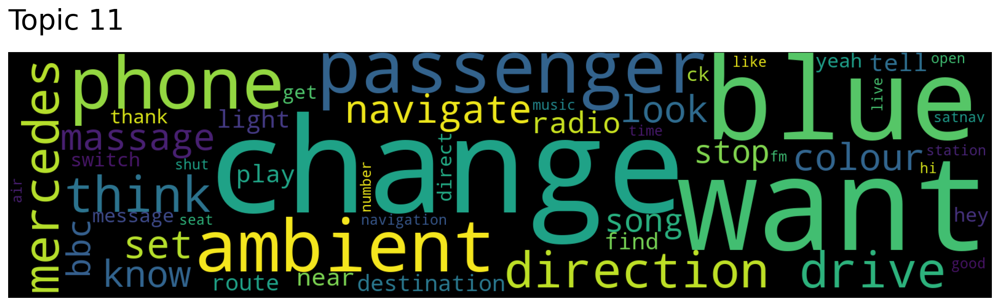

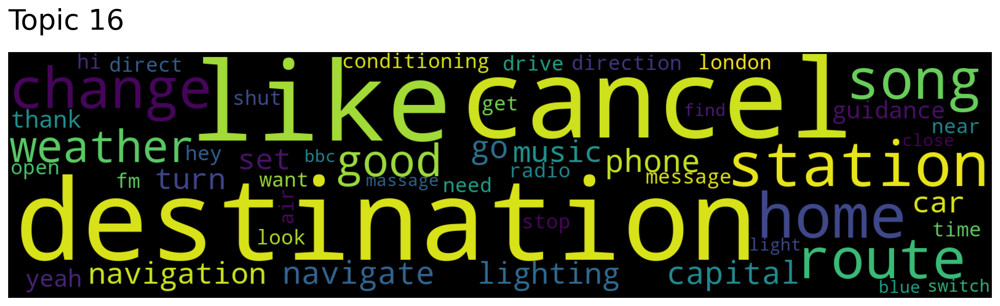

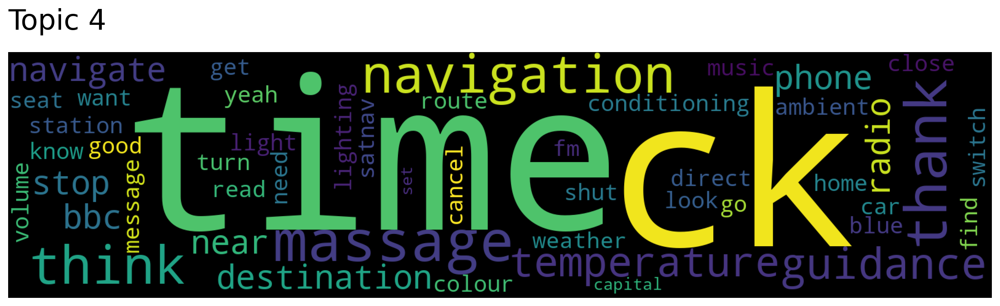

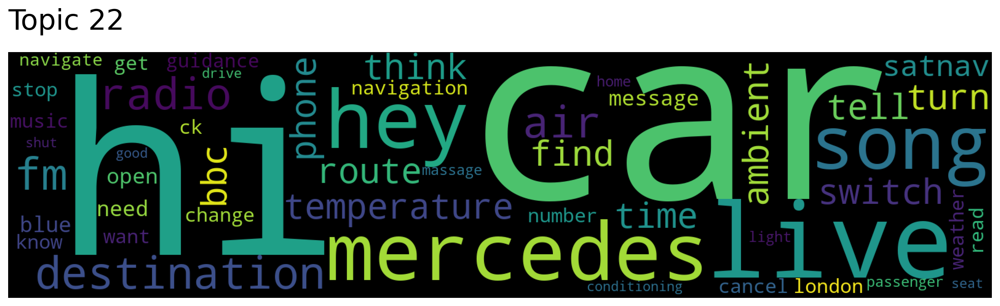

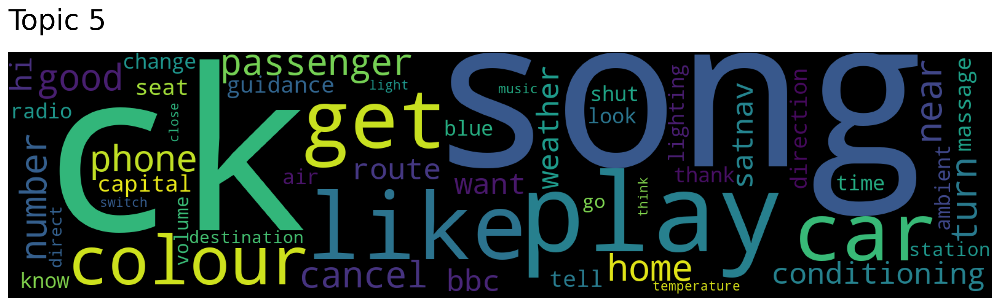

In [ ]:
keywords_select_st = widgets.Label('Enter keywords seperated by space: ')
display(keywords_select_st)

keywords_input_st = widgets.Text()
display(keywords_input_st)

keywords_neg_select_st = widgets.Label('Enter negative keywords seperated by space: ')
display(keywords_neg_select_st)

keywords_neg_input_st = widgets.Text()
display(keywords_neg_input_st)

doc_num_select_st = widgets.Label('Choose number of topics: ')
display(doc_num_select_st)

doc_num_input_st = widgets.Text(value='5')
display(doc_num_input_st)

def display_similar_topics(*args):
    
    clear_output()
    display(keywords_select_st)
    display(keywords_input_st)
    display(keywords_neg_select_st)
    display(keywords_neg_input_st)
    display(doc_num_select_st)
    display(doc_num_input_st)
    display(keyword_btn_st)
    
    try:
        topic_words, word_scores, topic_scores, topic_nums = top2vec.search_topics(keywords=keywords_input_st.value.split(),num_topics=int(doc_num_input_st.value), keywords_neg=keywords_neg_input_st.value.split())
        for topic in topic_nums:
            top2vec.generate_topic_wordcloud(topic, background_color="black")
        
    except Exception as e:
        print(e)
        
keyword_btn_st = widgets.Button(description="show topics")
display(keyword_btn_st)
keyword_btn_st.on_click(display_similar_topics)

In [ ]:
model_top2vec = top2vec
# model.get_num_topics()
k = model_top2vec.get_num_topics()
k

38

In [ ]:
topic_words, word_scores, topic_nums = model_top2vec.get_topics(1)
topic_words, word_scores, topic_nums

(array([['thank', 'know', 'ck', 'passenger', 'go', 'time', 'guidance',
         'find', 'drive', 'set', 'fm', 'colour', 'bbc', 'change', 'song',
         'hey', 'need', 'switch', 'conditioning', 'open', 'look',
         'satnav', 'blue', 'capital', 'car', 'music', 'direct', 'london',
         'destination', 'air', 'hi', 'massage', 'close', 'live', 'yeah',
         'good', 'navigate', 'temperature', 'shut', 'home', 'message',
         'think', 'stop', 'light', 'turn', 'mercedes', 'ambient',
         'navigation', 'route', 'play']], dtype='<U12'),
 array([[ 0.12894309,  0.10883892,  0.1014349 ,  0.10038622,  0.0908772 ,
          0.0894554 ,  0.07346296,  0.06015767,  0.05831217,  0.05533051,
          0.05331932,  0.05091682,  0.04995789,  0.04783877,  0.04782819,
          0.04470614,  0.04404137,  0.0418502 ,  0.03869929,  0.0367893 ,
          0.03574561,  0.03323657,  0.03280381,  0.03103874,  0.02826227,
          0.02725868,  0.02702338,  0.02419829,  0.02364171,  0.0235386 ,
    

In [ ]:
documents, document_scores, document_ids = model_top2vec.search_documents_by_topic(topic_num=1, num_docs=5)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 1769, Score: 0.27147814631462097
-----------
weather gdansk
-----------

Document: 9114, Score: 0.22716876864433289
-----------
music strollo
-----------

Document: 2087, Score: 0.22556528449058533
-----------
current price microvision
-----------

Document: 1581, Score: 0.22276900708675385
-----------
close restaurant chip shop
-----------

Document: 7693, Score: 0.21800407767295837
-----------
play summertime sadness
-----------



## Semantic check

In [ ]:
documents, document_scores, document_ids = model_top2vec.search_documents_by_keywords(keywords=["music", "radio", "play"], num_docs=5)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 1575, Score: 0.20812255144119263
-----------
dictate   < contact >
-----------

Document: 1271, Score: 0.2058057188987732
-----------
heart 90 radio
-----------

Document: 2438, Score: 0.2038518786430359
-----------
newtown
-----------

Document: 8333, Score: 0.19859153032302856
-----------
send message   < contact >
-----------

Document: 6616, Score: 0.18825435638427734
-----------
n number seven
-----------



In [ ]:
words, word_scores = top2vec.similar_words(keywords=["music", "radio", "play"], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

number 0.11938257521965198
tell 0.08036332706099167
drive 0.07737545261882536
car 0.07662115324532372
stop 0.07652540890058156
hey 0.06496442266588943
mercedes 0.062470583046080684
song 0.05636133725326624
yeah 0.05583930805687872
think 0.055802799694854514
turn 0.05378178254385324
phone 0.05231935828468892
blue 0.04782070230470788
look 0.044054468834796794
change 0.042996676405047715
ambient 0.03584352965409769
satnav 0.026940026459796755
know 0.025417194313644483
navigate 0.024690212043285132
want 0.023684820790394565


In [ ]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary

In [ ]:
glossary_dict = dict()
num = 0

for document in model['interpretation']:
  for token in document.split(' '): 
    if token not in glossary_dict.keys():
      glossary_dict[token]=num
      num += 1

In [ ]:
# Translate string representation of preprocessed text into numerical representation
corpus_list = list()
for document in model['interpretation']:
  document_list = list()
  for token in document.split(' '):
    document_list.append(glossary_dict[token])
  corpus_list.append(document_list)

In [ ]:
model['interpretation'] = corpus_list

In [ ]:
from gensim.corpora.dictionary import Dictionary
dictionary = Dictionary()
coherence_model_top2vec = CoherenceModel(model=model_top2vec, texts=preprocessed_list, dictionary = model_top2vec.word_indexes, coherence='c_v')
coherence_lda = coherence_model_top2vec.get_coherence()
print('\nCoherence Score: ', coherence_top2vec)